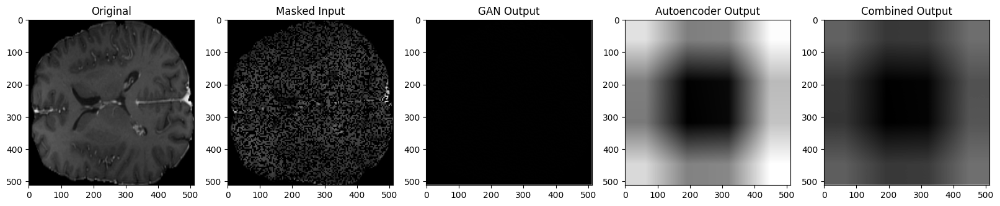

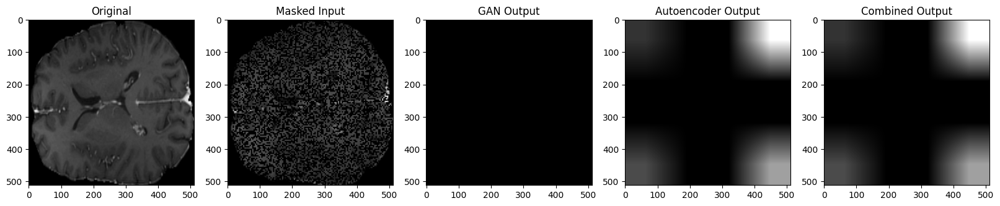

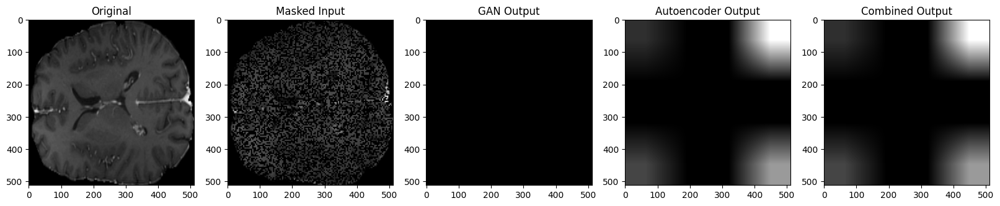

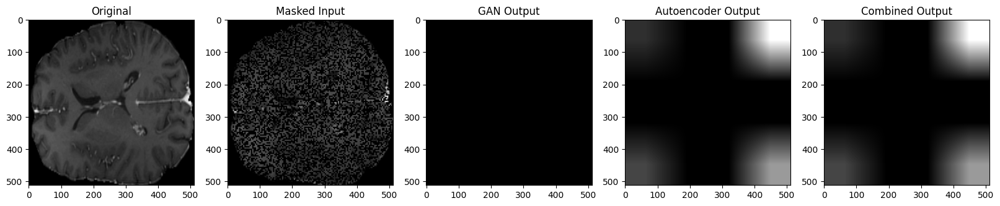

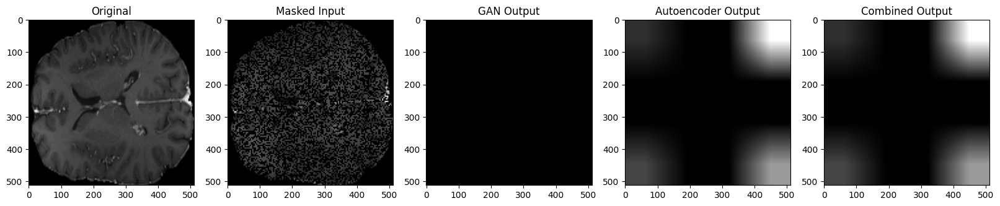

...

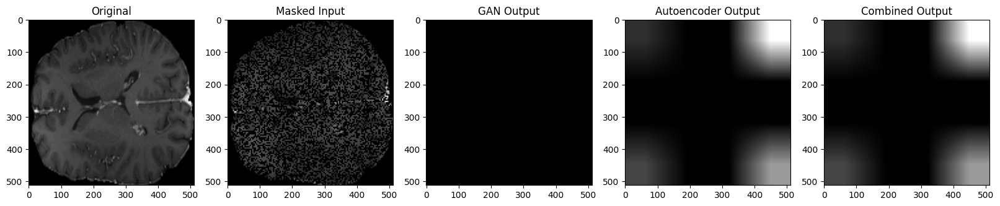

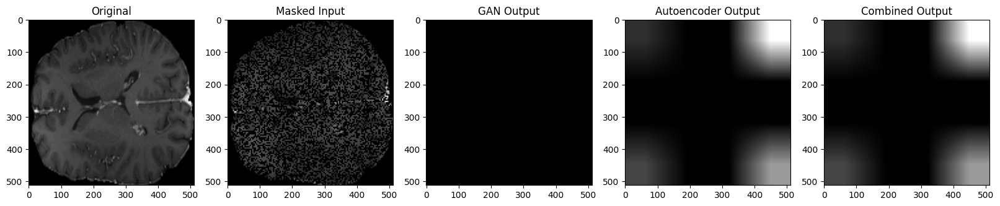

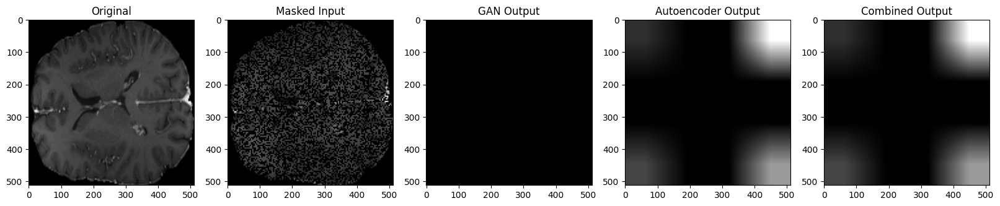

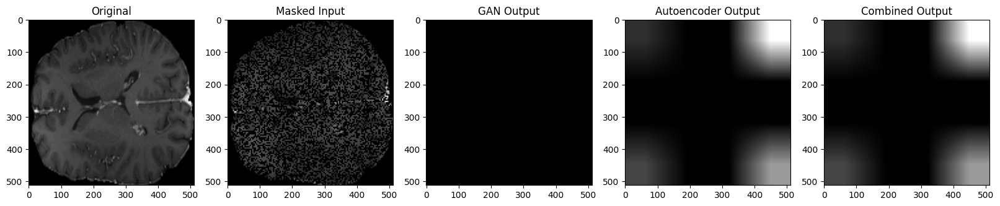

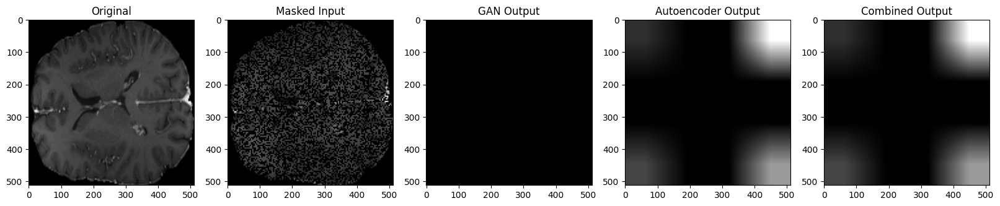

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model, Input
import numpy as np
import matplotlib.pyplot as plt

# Attention block definition
def AttentionBlock(x):
    channels = x.shape[-1]  # Get the number of channels in the input tensor
    attention = layers.Conv2D(channels, (1, 1), activation='sigmoid')(x)  # Match the number of channels
    return layers.multiply([x, attention])  # Element-wise multiplication


# Generator Model for GAN
def generator_model():
    inputs = Input(shape=(512, 512, 1))
    
    x = layers.Conv2D(128, (5, 5), padding='same')(inputs)
    x = layers.LeakyReLU()(x)
    x = AttentionBlock(x)  # Attention module
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.Conv2D(512, (3, 3), padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = AttentionBlock(x)
    x = layers.Conv2D(1, (3, 3), padding='same', activation='sigmoid')(x)
    
    return Model(inputs, x)

# Discriminator Model for GAN
def discriminator_model():
    inputs = Input(shape=(512, 512, 1))
    
    x = layers.Conv2D(128, (5, 5), padding='same')(inputs)
    x = layers.LeakyReLU()(x)
    x = AttentionBlock(x)
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.Conv2D(512, (3, 3), padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.Conv2D(1, (3, 3), padding='same', activation='sigmoid')(x)
    
    return Model(inputs, x)

# Autoencoder for reconstructing windows
def autoencoder_model():
    inputs = Input(shape=(4, 4, 1))
    
    x = layers.Conv2D(64, (3, 3), padding='same')(inputs)
    x = layers.LeakyReLU()(x)
    x = AttentionBlock(x)
    x = layers.Conv2D(128, (3, 3), padding='same')(x)
    x = layers.LeakyReLU()(x)
    x = layers.Conv2D(64, (3, 3), padding='same')(x)
    x = AttentionBlock(x)
    x = layers.Conv2D(1, (3, 3), padding='same', activation='sigmoid')(x)
    
    return Model(inputs, x)

# Loss Function: weighted SSIM and MSE
def weighted_loss(y_true, y_pred):
    ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
    mse_loss = tf.reduce_mean(tf.square(y_true - y_pred))
    return 0.2 * mse_loss + 0.8 * ssim_loss

# Instantiate models
gen_model = generator_model()
disc_model = discriminator_model()
autoenc_model = autoencoder_model()

# Compile models
gen_model.compile(optimizer='adam', loss=weighted_loss)
disc_model.compile(optimizer='adam', loss='binary_crossentropy')
autoenc_model.compile(optimizer='adam', loss='mse')

# Sample image load function
def load_image(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_png(img, channels=1)  # Assuming grayscale image
    img = tf.image.resize(img, [512, 512])
    img = img / 255.0  # Normalize to [0,1]
    return np.expand_dims(img, axis=0)  # Add batch dimension

# Masking function (random 4x4 patches)
def apply_random_mask(img, mask_size=4):
    masked_img = img.copy()
    for _ in range(100):  # Apply multiple random masks
        x = np.random.randint(0, img.shape[1] - mask_size)
        y = np.random.randint(0, img.shape[2] - mask_size)
        masked_img[:, x:x+mask_size, y:y+mask_size, :] = 0
    return masked_img

import matplotlib.pyplot as plt
def apply_random_mask(image, mask_size=4):
    mask = np.ones(image.shape)
    for i in range(0, image.shape[1], mask_size):
        for j in range(0, image.shape[2], mask_size):
            if np.random.rand() > 0.5:  # Randomly select blocks to mask
                mask[:, i:i+mask_size, j:j+mask_size, :] = 0
    return image * mask  # Return masked image

# Visualization function
def visualize_outputs(original, masked, gan_output, autoencoder_output, combined_output):
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))
    axes[0].imshow(original[0, :, :, 0], cmap='gray')
    axes[0].set_title("Original")
    axes[1].imshow(masked[0, :, :, 0], cmap='gray')
    axes[1].set_title("Masked Input")
    axes[2].imshow(gan_output[0, :, :, 0], cmap='gray')
    axes[2].set_title("GAN Output")
    axes[3].imshow(autoencoder_output[0, :, :, 0], cmap='gray')
    axes[3].set_title("Autoencoder Output")
    axes[4].imshow(combined_output[0, :, :, 0], cmap='gray')
    axes[4].set_title("Combined Output")
    plt.show()

# Callback for printing every 50 epochs
class OutputCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 50 == 0:
            # Predict with the GAN and Autoencoder
            gan_output = gen_model.predict(masked_image)
            autoencoder_output = autoenc_model.predict(image_window)

            # Upscale autoencoder output to match the GAN output (512x512)
            autoencoder_output_resized = tf.image.resize(autoencoder_output, [512, 512])

            # Combine outputs
            combined_output = (gan_output + autoencoder_output_resized) / 2

            # Visualize outputs
            visualize_outputs(original_image, masked_image, gan_output, autoencoder_output_resized, combined_output)

# Load the image
original_image = load_image('61_processed_image_edit.png')  # Load your image
masked_image = apply_random_mask(original_image)

# For autoencoder, take a window of size 4x4 from the original image
image_window = original_image[:, 0:4, 0:4, :]  # Example window

# Create callback instance
output_callback = OutputCallback()

# Define the training loop
num_epochs = 10000  # Example value

# Training loop
for epoch in range(num_epochs):
    # Train the GAN model on masked image
    gan_loss = gen_model.train_on_batch(masked_image, original_image)

    # Train the autoencoder on a 4x4 image window
    autoencoder_loss = autoenc_model.train_on_batch(image_window, image_window)

    # Call the callback for visualization
    output_callback.on_epoch_end(epoch)


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to load and normalize the test images (infected brain)
def load_test_images(infected_image_path):
    infected_image = tf.keras.preprocessing.image.load_img(infected_image_path, color_mode='grayscale', target_size=(512, 512))
    infected_image = np.array(infected_image).reshape(1, 512, 512, 1)
    infected_image = infected_image / 255.0  # Normalize to [0, 1]
    return infected_image

# Function to predict the masked area using the autoencoder
def predict_masked_area(autoencoder, image, window_size=4):
    h, w = image.shape[1:3]
    masked_output = np.zeros_like(image)

    # Create a list to hold all windows for batch processing
    windows = []
    indices = []

    for i in range(0, h, window_size):
        for j in range(0, w, window_size):
            # Define window boundaries
            window = image[:, i:i + window_size, j:j + window_size, :]
            windows.append(window)
            indices.append((i, j))

    # Convert list of windows to numpy array for batch processing
    windows = np.concatenate(windows, axis=0)  # Shape: (number_of_windows, window_size, window_size, 1)
    print(f"Processing {windows.shape[0]} windows...")

    # Predict in batch
    predicted_windows = autoencoder.predict(windows)

    # Place predicted windows back into the masked output
    for idx, (i, j) in enumerate(indices):
        masked_output[:, i:i + window_size, j:j + window_size, :] = predicted_windows[idx]

    return masked_output

# Function to display the test results
def display_test_results(original_image, autoencoder_output, gan_output, combined_image):
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    axs[0].imshow(original_image.squeeze(), cmap='gray')
    axs[0].set_title('Original Infected Brain Image')
    axs[0].axis('off')

    axs[1].imshow(autoencoder_output.squeeze(), cmap='gray')
    axs[1].set_title('Autoencoder Output (Masked Area)')
    axs[1].axis('off')

    axs[2].imshow(gan_output.squeeze(), cmap='gray')
    axs[2].set_title('GAN Output (Clean Brain Image)')
    axs[2].axis('off')

    axs[3].imshow(combined_image.squeeze(), cmap='gray')
    axs[3].set_title('Combined Image (Autoencoder + GAN)')
    axs[3].axis('off')

    plt.show()

# Function for testing the complete model (Autoencoder + GAN)
def test_model(autoencoder, generator, infected_image_path):
    # Load the test image
    infected_image = load_test_images(infected_image_path)

    # Step 1: Use the autoencoder to predict the masked area
    autoencoder_output = predict_masked_area(autoencoder, infected_image)

    # Step 2: Use the GAN to predict the clean brain image from the original infected image
    gan_output = generator.predict(infected_image)

    # Step 3: Combine the autoencoder output and GAN output
    combined_image = autoencoder_output + gan_output  # Adjust as needed to combine images

    # Step 4: Display the results
    display_test_results(infected_image, autoencoder_output, gan_output, combined_image)

# Paths to the test images (replace these paths with actual test image paths)
infected_image_path = r"C:\Users\priya\Documents\DL project\test\processed_image_edit.png"
infected_image_path=infected_image_path_255.0

# Load the trained models
autoencoder = tf.keras.models.load_model('models/autoencoder_9900.h5')  # Adjust path if needed
generator = tf.keras.models.load_model('models/generator_9900.h5')  # Adjust path if needed

# Run the test
test_model(autoencoder, generator, infected_image_path)
